In [1]:
#!/usr/bin/env python
# -*- coding: utf-8 -*-
# ***********************************
# Version: 0.1.1                    #
# Author:  rongboshen               #
# Email:   rongboshen2019@gmail.com #
# Date:    2023.04.27               #
# ***********************************

import os
import numpy as np
import pandas as pd
import scipy.stats as st
import scipy.io as io
import scanpy as sc
from anndata import AnnData
import json
import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
import matplotlib.pyplot as plt
from scipy import stats
import seaborn as sns
import anndata as ad
import cv2
import hotspot
from scipy.cluster.hierarchy import leaves_list
import warnings
warnings.filterwarnings("ignore")

In [2]:
def reorder(adata, subname, rev=True):
    if rev:
        nindex = np.argsort(adata.obs[subname])[::-1]
    else:
        nindex = np.argsort(adata.obs[subname])
    adata_reorder = adata[nindex,:]
    return adata_reorder

def refine_cell_type(adata, image, save_dir, final_pred, color_palette):
    sc.settings.figdir = save_dir
    adata_low = adata[adata.obs['confidence level']=='low',:]
    adata_high = adata[adata.obs['confidence level']=='high',:]
    low_conf_ratio = adata_low.shape[0] / adata.shape[0]
    print('low confidence number and ratio: %d, %.4f'%(adata_low.shape[0], low_conf_ratio))

    sc.pl.umap(adata_high, color=final_pred, palette=color_palette, legend_fontsize='x-small', save='_high_confidence.pdf')

    # feature clustering for low confidence cells
    sc.pp.pca(adata_low)
    sc.pp.neighbors(adata_low)
    sc.tl.leiden(adata_low, key_added='clusters', resolution=0.8)
    sc.pl.umap(adata_low, color='clusters', legend_fontsize='x-small', save='_low_clusters.pdf')
    sc.pl.umap(adata_low, color='cell_pred', palette=color_palette, legend_fontsize='x-small', save='_low_pred.pdf')
    sc.pl.umap(adata_low, color='celltype_refined', palette=color_palette, legend_fontsize='x-small', save='_low_celltype.pdf')
    print('==> Clusters distribution for low confidence cells:\n', adata_low.obs.clusters.value_counts())
    print('==> Cell_pred distribution for low confidence cells:\n', adata_low.obs.cell_pred.value_counts())
    print('==> Cell_type distribution for low confidence cells:\n', adata_low.obs.celltype_refined.value_counts())


    adjusted_cell_types = []
    for name, conf, pred in zip(adata.obs.index.to_list(), adata.obs['confidence level'].to_list(), adata.obs['cell_pred'].to_list()):
        if conf == 'high':
            adjusted_cell_types.append(pred)
        else:
            cluster_label = adata_low.obs.clusters[name]
            adjusted_cell_types.append(cluster_label)

    adata.obs['cell_type_adjust'] = adjusted_cell_types
    adata.obs['cell_type_adjust'] = adata.obs['cell_type_adjust'].astype('category')
    print(set(adjusted_cell_types))

    sc.tl.dendrogram(adata, groupby='cell_type_adjust')
    sc.pl.dendrogram(adata, groupby='cell_type_adjust', save='_cell_type_adjust.pdf')

    return adata

def local_correlation_plot(local_correlation_z, modules, linkage, save_dir, ext, mod_cmap='tab20', vmin=-8, vmax=8, z_cmap='RdBu_r', yticklabels=False): 
    row_colors = None
    colors = list(plt.get_cmap(mod_cmap).colors)
    module_colors = {i: colors[(i-1) % len(colors)] for i in modules.unique()}
    module_colors[-1] = '#ffffff'

    row_colors1 = pd.Series(
        [module_colors[i] for i in modules],
        index=local_correlation_z.index,
    )

    row_colors = pd.DataFrame({
        "Modules": row_colors1,
    })

    cm = sns.clustermap(local_correlation_z, row_linkage=linkage, col_linkage=linkage, vmin=vmin, vmax=vmax, cmap=z_cmap,
                        xticklabels=False, yticklabels=yticklabels, row_colors=row_colors, rasterized=True, cbar_pos=(1.02, 0.2, 0.03, 0.2))


    fig = plt.gcf()
    plt.sca(cm.ax_heatmap)
    plt.ylabel("")
    plt.xlabel("")

    cm.ax_row_dendrogram.remove()
    cm.ax_col_dendrogram.remove()

    # Add 'module X' annotations
    ii = leaves_list(linkage)

    mod_reordered = modules.iloc[ii]

    mod_map = {}
    y = np.arange(modules.size)

    for x in mod_reordered.unique():
        if x == -1:
            continue

        mod_map[x] = y[mod_reordered == x].mean()

    plt.sca(cm.ax_row_colors)
    for mod, mod_y in mod_map.items():
        plt.text(-.5, y=mod_y, s="M{}".format(mod), fontsize='xx-large',
                 horizontalalignment='right',
                 verticalalignment='center')
    plt.xticks([])

    # Find the colorbar 'child' and modify
    min_delta = 1e99
    min_aa = None
    for aa in fig.get_children():
        try:
            bbox = aa.get_position()
            delta = (0-bbox.xmin)**2 + (1-bbox.ymax)**2
            if delta < min_delta:
                delta = min_delta
                min_aa = aa
        except AttributeError:
            pass

    min_aa.set_ylabel('Z-Scores')
    min_aa.yaxis.set_label_position("left")
    plt.savefig(os.path.join(save_dir, 'module_local_correlation_%s.pdf'%ext), bbox_inches='tight', dpi=100)

In [3]:
data_dir = '../nsclc/Results'
save_dir = '../nsclc/degs6'
colorsa = list(plt.get_cmap('tab20').colors)
colorsb = list(plt.get_cmap('tab20b').colors)
colorsc = list(plt.get_cmap('tab20c').colors)

np.random.seed(42)
if not os.path.exists(save_dir): os.makedirs(save_dir)
sc.settings.figdir = save_dir

# analysis and visualization.
color_palette =  {'tumors': colorsa[6], 'T CD8': colorsa[0], 'T CD4': colorsa[1], 'Treg': colorsa[17], 'fibroblast': colorsa[4], 
                  'macrophage': colorsa[12], 'endothelial': colorsa[2], 'plasmablast': colorsa[18], 'B-cell': colorsa[19], 'mast': colorsa[16], 
                  'mDC': colorsa[10], 'epithelial': colorsa[3], 'monocyte': colorsa[13], 'neutrophil': colorsa[8], 'NK': colorsa[14], 'pDC': colorsa[11], 'x': 'grey'}


2023-12-13 09:15:49.986105: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-12-13 09:15:50.365317: I tensorflow/core/util/port.cc:104] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2023-12-13 09:15:51.681459: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /home/jy/JYuan/miniconda3/lib/python3.10/site-packages/cv2/../../lib64:/data/bioinf/jyu

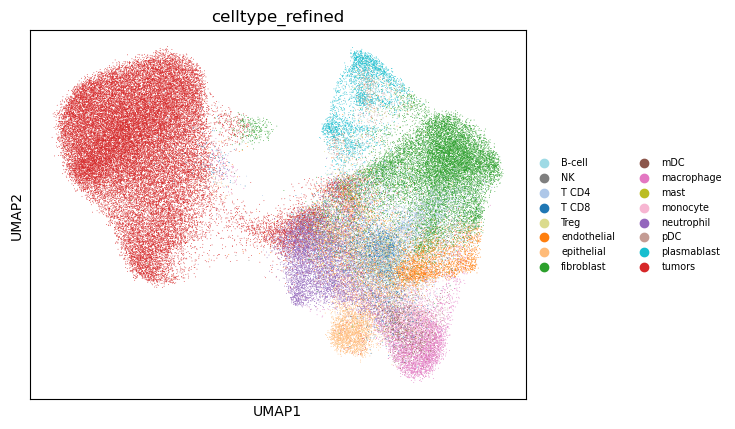

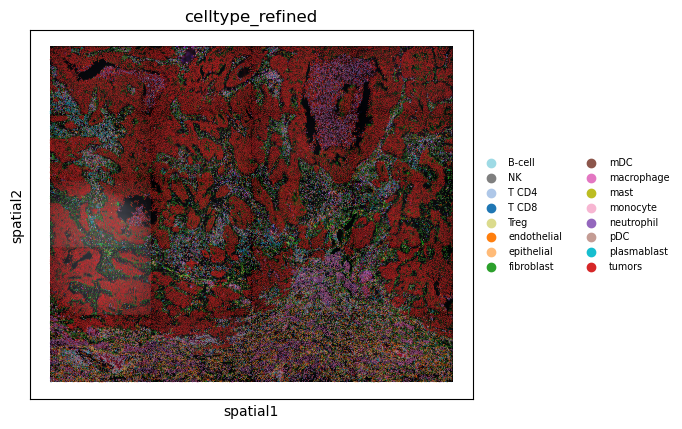

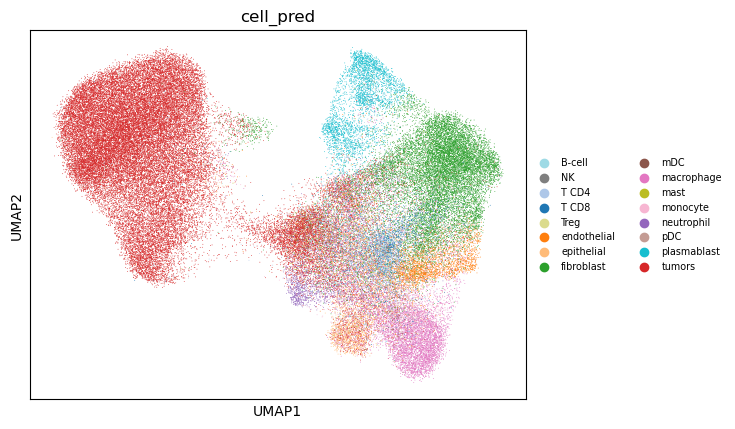

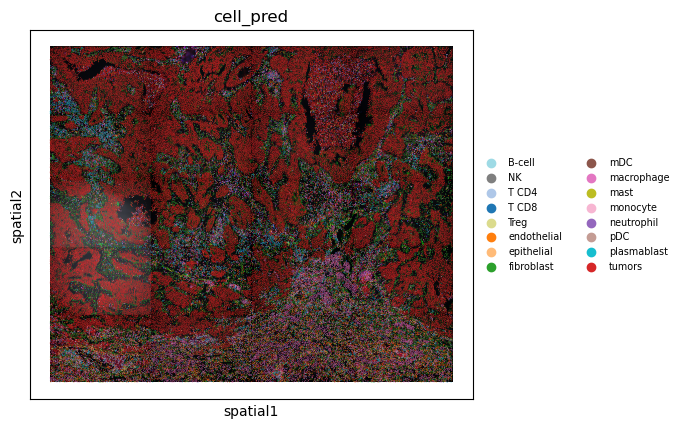

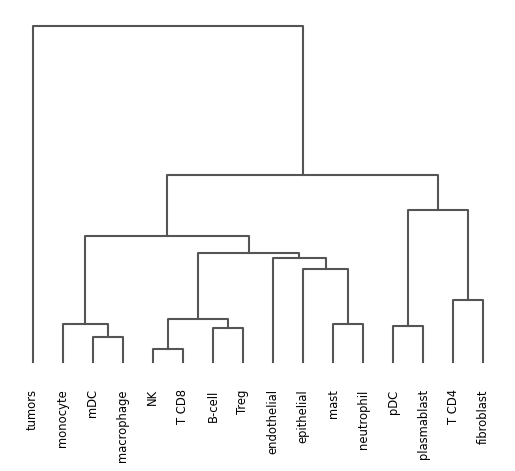

<Axes: >

In [4]:
##### Step1. processing
sc_adata = sc.read('../nsclc/data/scRNA_cc.h5ad')
types_dict = dict(set(zip(sc_adata.obs.labels.to_list(), sc_adata.obs.cell_types.to_list())))


st_adata = sc.read(os.path.join(data_dir, 'nsclc_pred_16_100_1_2023-05-30-02-52-24.h5ad'))
# source data
src_adata = sc.read(os.path.join('../nsclc/data', 'nsclc_ori.h5ad'))

src_genes = src_adata.var_names.to_list()
filtered_genes = [g for g in src_genes if 'NegPrb' not in g]
src_adata = src_adata[:, src_adata.var_names.isin(filtered_genes)]

he_image = cv2.imread('../nsclc/data/merged_image.jpg')
src_adata.obs['cell_pred'] = st_adata.obs['pred_cls']
src_adata.obs['conf'] = st_adata.obs['conf']
src_adata.obsm['results'] = st_adata.obsm['results']

src_adata.layers['count'] = src_adata.X
tmp = src_adata.X

sc.pp.normalize_total(src_adata)
sc.pp.log1p(src_adata)

sc.pp.pca(src_adata, n_comps=100)
sc.pp.neighbors(src_adata)
sc.tl.umap(src_adata)
sc.pl.umap(src_adata, color='celltype_refined', palette=color_palette, legend_fontsize='x-small', save="_src.pdf")
sc.pl.spatial(src_adata, img=he_image, color='celltype_refined', palette=color_palette, spot_size=40, legend_fontsize='x-small', save="_src.pdf")
sc.pl.umap(src_adata, color='cell_pred', palette=color_palette, legend_fontsize='x-small', save="_pred_direct.pdf")
sc.pl.spatial(src_adata, img=he_image, color='cell_pred', palette=color_palette, spot_size=40, legend_fontsize='x-small', save='_cell_direct.pdf')

sc.tl.dendrogram(src_adata, groupby='celltype_refined')
sc.pl.dendrogram(src_adata, groupby='celltype_refined', save='_src.pdf')

===> threshold: 0.5


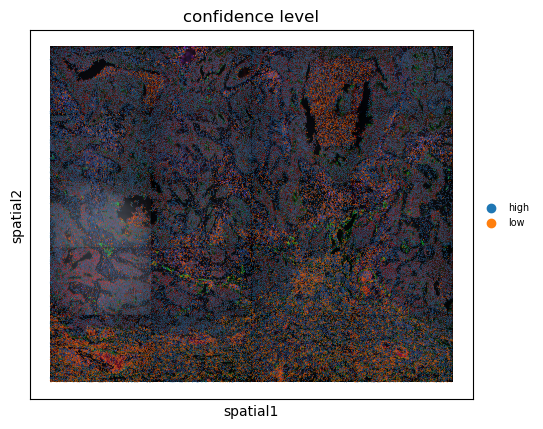

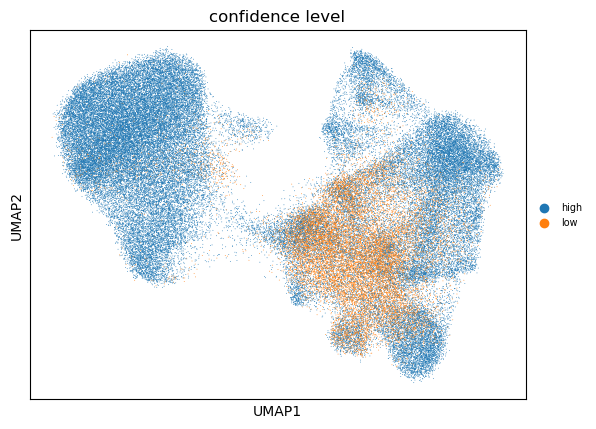

low confidence number and ratio: 16991, 0.2032


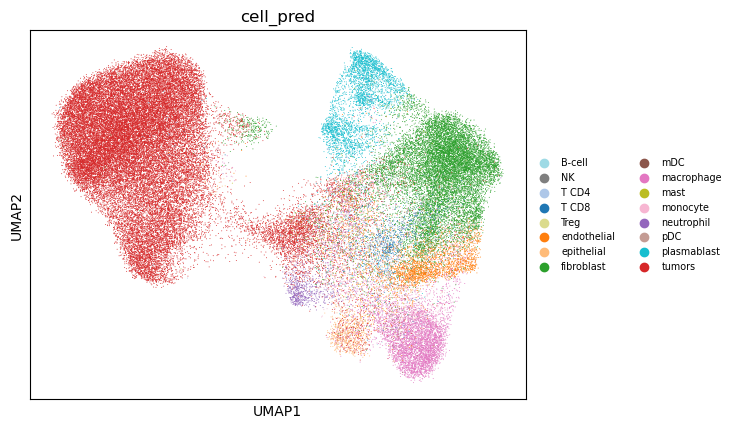

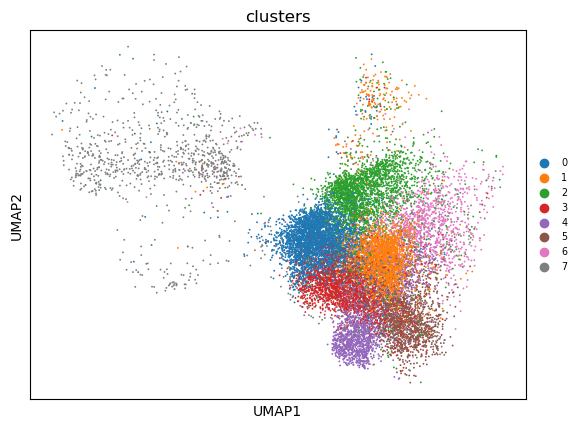

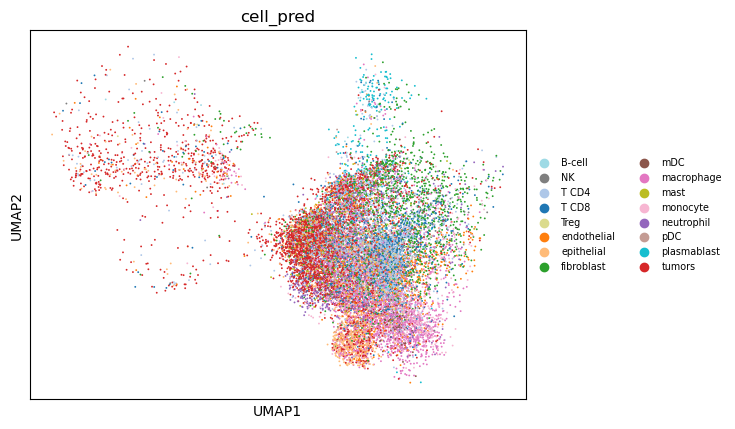

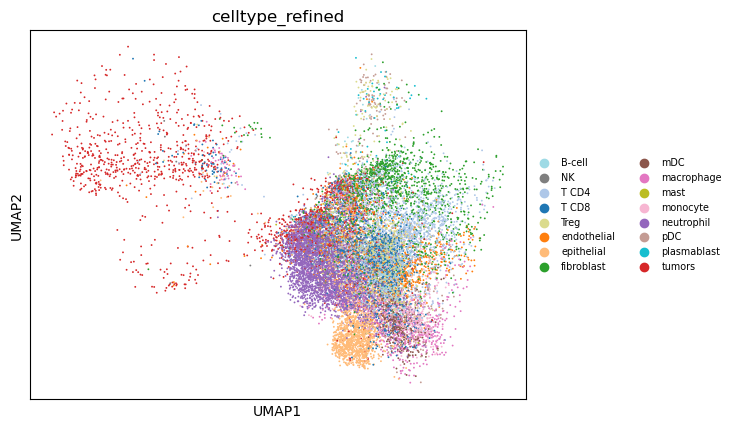

==> Clusters distribution for low confidence cells:
 clusters
0    3799
1    2811
2    2698
3    2125
4    1764
5    1626
6    1111
7    1057
Name: count, dtype: int64
==> Cell_pred distribution for low confidence cells:
 cell_pred
tumors         3544
T CD4          2485
macrophage     2436
fibroblast     1621
epithelial     1407
T CD8          1206
endothelial    1004
monocyte        946
neutrophil      682
mast            468
plasmablast     386
NK              325
B-cell          195
mDC             134
Treg             89
pDC              63
Name: count, dtype: int64
==> Cell_type distribution for low confidence cells:
 celltype_refined
neutrophil     3539
T CD4          2262
epithelial     1859
T CD8          1475
tumors         1374
fibroblast     1309
endothelial    1141
Treg            884
monocyte        684
macrophage      606
B-cell          556
NK              461
mDC             388
pDC             333
plasmablast      64
mast             56
Name: count, dtype: int64
{'2',

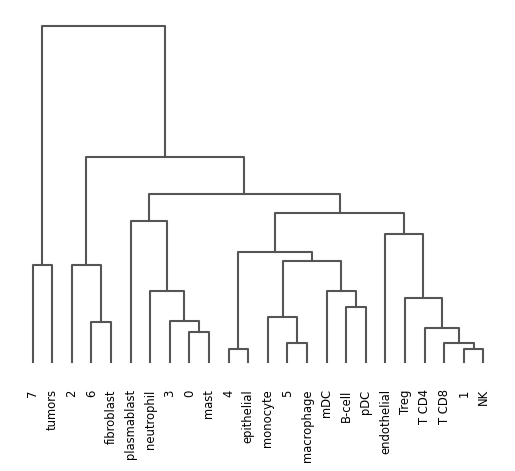

In [5]:
##### Step2. adjust cell type prediction by threshold and feature clustering.

#threshold = np.percentile(src_adata.obs.conf, 25)
threshold = 0.5
print('===> threshold:', threshold)

raw_cell_types = ['NK', 'mast', 'Treg', 'pDC', 'epithelial', 'neutrophil', 'mDC']
results_arr = src_adata.obsm['results']
conf_list = []
count = 0
for i in range(src_adata.shape[0]):
    if src_adata.obs.conf[i] < threshold: 
        conf_list.append('low')
        count += 1
    else:
        conf_list.append('high')
src_adata.obs['confidence level'] = conf_list


sc.pl.spatial(src_adata, img=he_image, color='confidence level', spot_size=40, legend_fontsize='x-small', save='_confidence_level.pdf')
sc.pl.umap(src_adata, color='confidence level', legend_fontsize='x-small', save='_confidence_level.pdf')

# refine processing.
src_adata = refine_cell_type(src_adata, he_image, save_dir, 'cell_pred', color_palette)

Final cell type distribution:
 final_cell_types
tumors         38827
fibroblast     14161
macrophage      6431
plasmablast     5009
neutrophil      4092
mast            4056
endothelial     2977
epithelial      2651
T CD4           2112
T CD8           1436
monocyte        1075
NK               437
B-cell           157
Treg             119
mDC               65
pDC               16
Name: count, dtype: int64


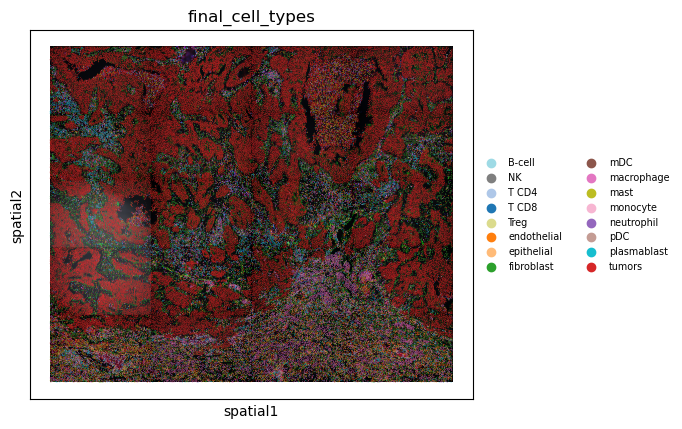

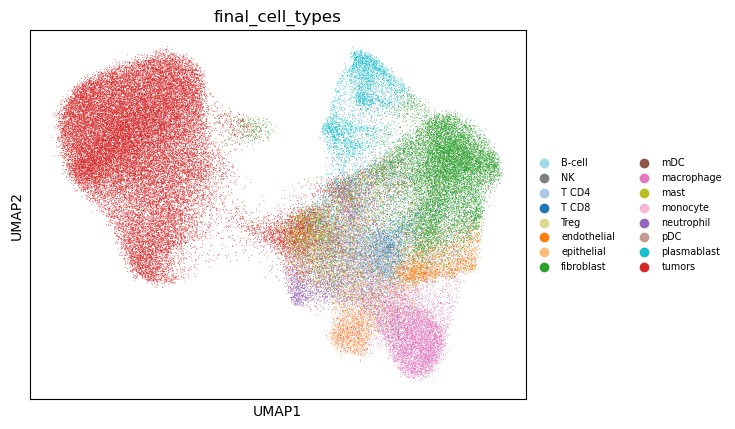

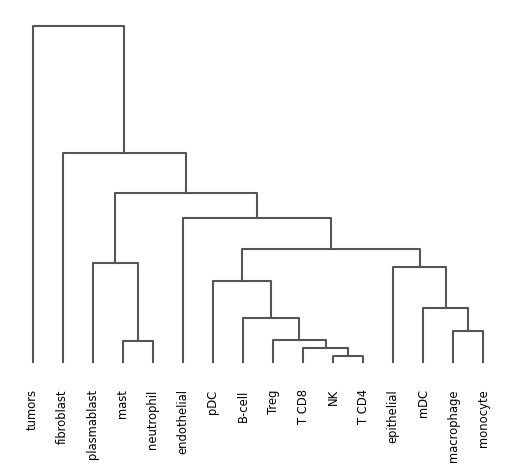

===> Accuracies between pre-adjust and post-adjust: 0.7514, 0.7498


In [6]:
###### Step3. adjusting cell types.
merged_cell_types = []
for i, cta in enumerate(src_adata.obs.cell_type_adjust):
    tmp_arr = results_arr[i]
    orders = np.argsort(-tmp_arr)
    if cta == '7':
        merged_cell_types.append('tumors')
    elif cta == '4':
        merged_cell_types.append('epithelial')
    elif cta == '6':
        merged_cell_types.append('fibroblast')
    elif cta == '5':
        for y in orders:
            if types_dict[y] in ['macrophage', 'monocyte']:
                merged_cell_types.append(types_dict[y])
                break
    elif cta == '1':
        for y in orders:
            if types_dict[y] in ['T CD8', 'T CD4', 'Treg', 'NK']:
                merged_cell_types.append(types_dict[y])
                break
    elif cta == '0' or cta == '2' or cta == '3':
        for y in orders:
            if types_dict[y] in ['neutrophil', 'plasmablast', 'mast']:
                merged_cell_types.append(types_dict[y])
                break
    else:
        merged_cell_types.append(cta)

src_adata.obs['final_cell_types'] = merged_cell_types
print('Final cell type distribution:\n', src_adata.obs['final_cell_types'].value_counts())

sc.pl.spatial(src_adata, img=he_image, color='final_cell_types', palette=color_palette, spot_size=40, legend_fontsize='x-small', save='_final_cell_prediction.pdf')
sc.pl.umap(src_adata, color='final_cell_types', palette=color_palette, legend_fontsize='x-small', save='_final_cell_prediction.pdf')
sc.tl.dendrogram(src_adata, groupby='final_cell_types')
sc.pl.dendrogram(src_adata, groupby='final_cell_types', save='_final.pdf')



## conpare the accuracies between pre-adjust and post-adjust.
true_label = np.array(src_adata.obs['celltype_refined'])
pre_cell_pred = np.array(src_adata.obs['cell_pred'])
post_cell_pred = np.array(src_adata.obs['final_cell_types'])
pre_acc = np.sum(pre_cell_pred == true_label) *1. / src_adata.shape[0]
post_acc = np.sum(post_cell_pred == true_label) *1. / src_adata.shape[0]

print('===> Accuracies between pre-adjust and post-adjust: %.4f, %.4f'%(pre_acc, post_acc))

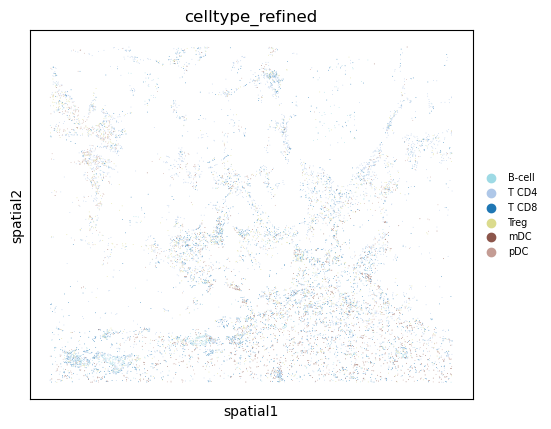

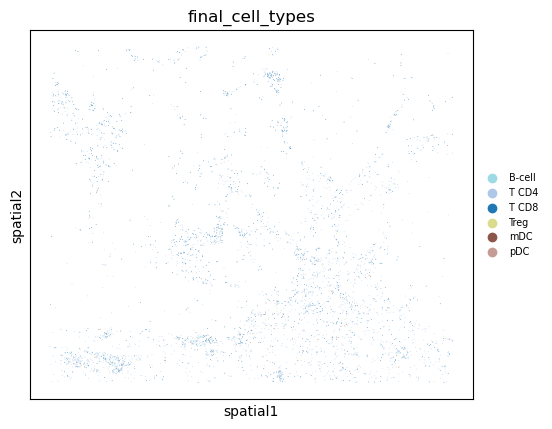

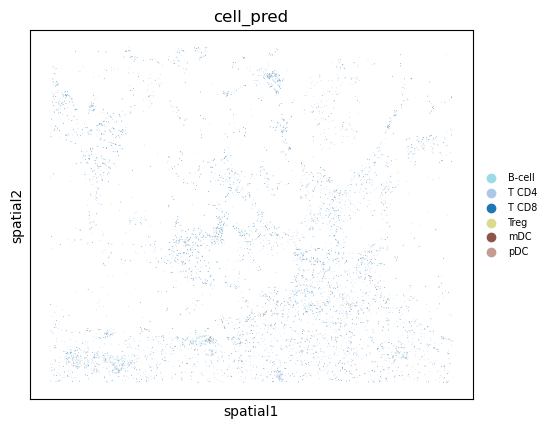

In [7]:
## visualization for 3D lymph nodes.
immune_cell_types = ['B-cell', 'mDC', 'pDC', 'Treg', 'T CD8', 'T CD4']

cr_adata = src_adata[src_adata.obs.celltype_refined.isin(immune_cell_types), :]
ft_adata = src_adata[src_adata.obs.final_cell_types.isin(immune_cell_types), :]
cp_adata = src_adata[src_adata.obs.cell_pred.isin(immune_cell_types), :]
sc.pl.spatial(cr_adata, img=None, color='celltype_refined', palette=color_palette, spot_size=40, legend_fontsize='x-small', save='_im_gt.pdf')
sc.pl.spatial(ft_adata, img=None, color='final_cell_types', palette=color_palette, spot_size=40, legend_fontsize='x-small', save='_im_fp.pdf')
sc.pl.spatial(cp_adata, img=None, color='cell_pred', palette=color_palette, spot_size=40, legend_fontsize='x-small', save='_im_pd.pdf')


100%|██████████| 960/960 [00:18<00:00, 52.47it/s]


Computing pair-wise local correlation on 921 features...


100%|██████████| 423660/423660 [05:24<00:00, 1306.88it/s]


Computing scores for 6 modules...


100%|██████████| 6/6 [00:06<00:00,  1.01s/it]


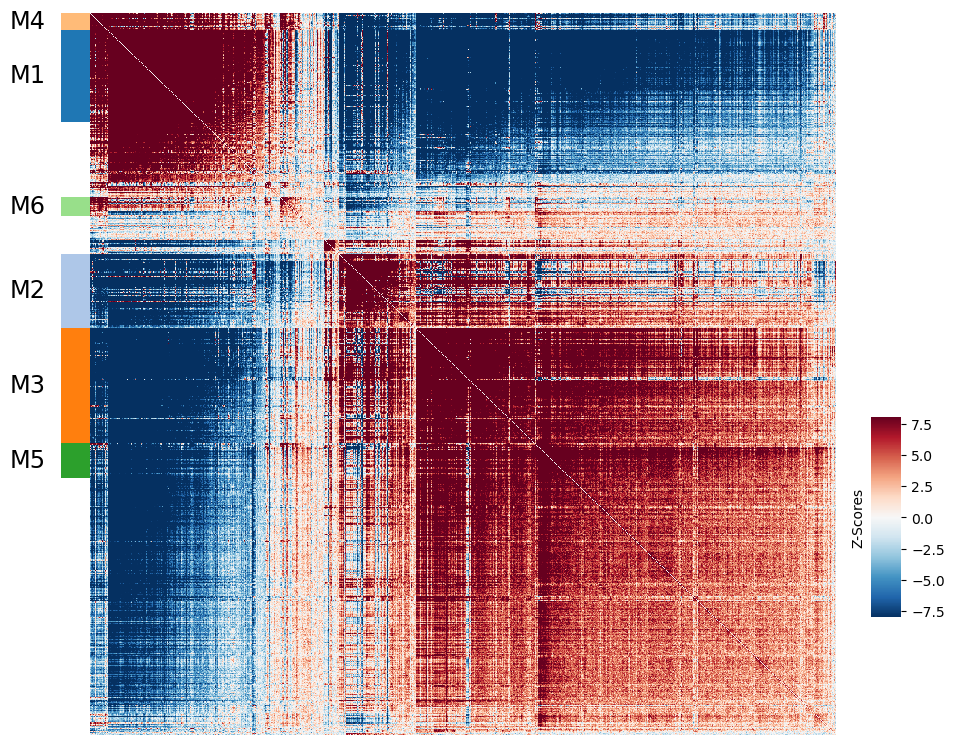

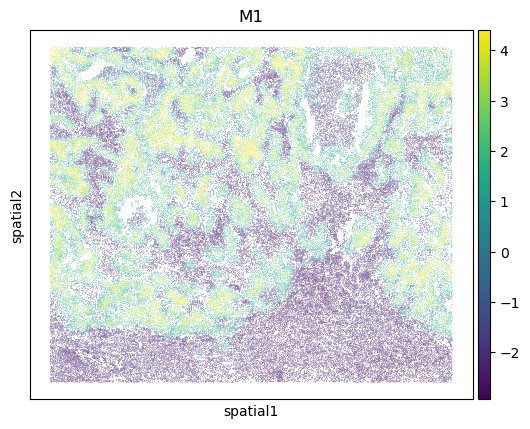

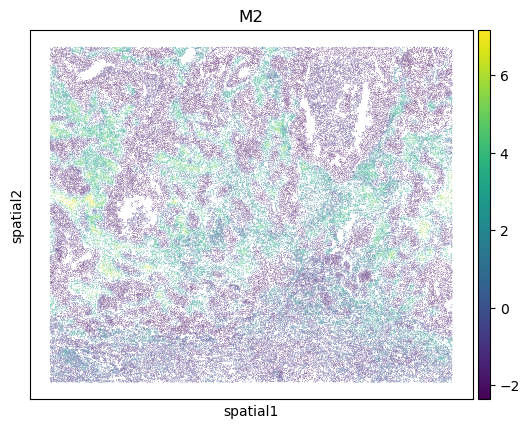

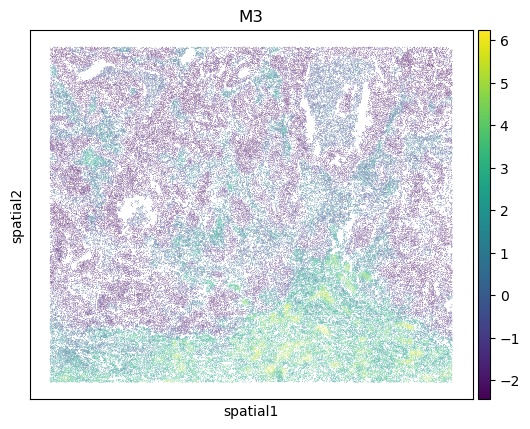

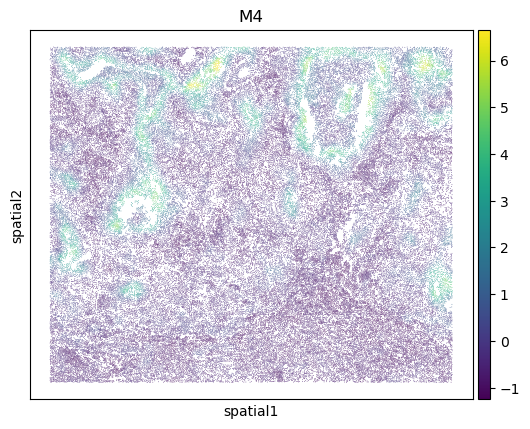

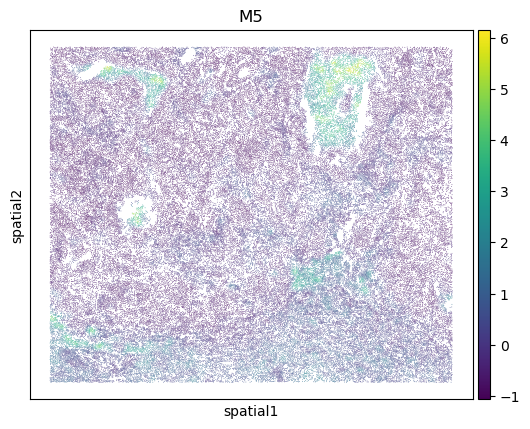

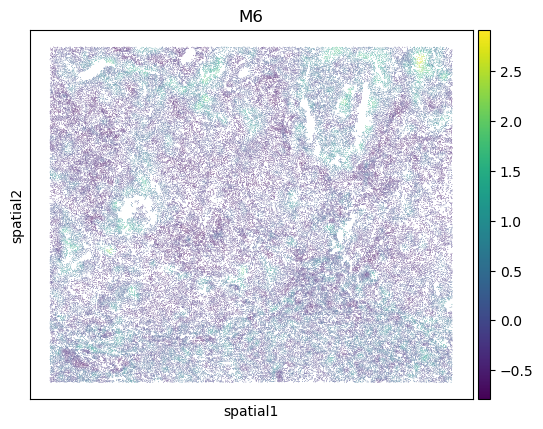

In [8]:
## spatial gene patterns
src_adata.obs['total_counts'] = np.sum(src_adata.layers['count'], axis=1)

hs = hotspot.Hotspot(src_adata, layer_key='count', model='danb', latent_obsm_key='spatial', umi_counts_obs_key='total_counts')
hs.create_knn_graph(weighted_graph=False, n_neighbors=30)
hs_results = hs.compute_autocorrelations()
hs_genes = hs_results.loc[hs_results.FDR < 0.05].index
local_correlations = hs.compute_local_correlations(hs_genes, jobs=8)
modules = hs.create_modules(min_gene_threshold=20, core_only=True, fdr_threshold=0.05)
module_scores = hs.calculate_module_scores()

local_correlation_plot(local_correlation_z=hs.local_correlation_z, modules=hs.modules, linkage=hs.linkage, save_dir=save_dir, ext='nsclc')

for module in range(1, hs.modules.max()+1):
    src_adata.obs['M%d'%module] = hs.module_scores[module]
    sc.pl.spatial(src_adata, img=None, color='M%d'%module, spot_size=40, legend_fontsize='x-small', save='spatial_M%d.pdf'%module)

results = hs.results.join(hs.modules)
results.sort_values(by=['Module', 'Z'], ascending=[True, False]).to_csv(os.path.join(save_dir, 'hotspot_modules_nsclc.csv'))

src_adata.layers['count'] = tmp
src_adata.write(os.path.join(data_dir, 'nsclc_cc_530.h5ad'))

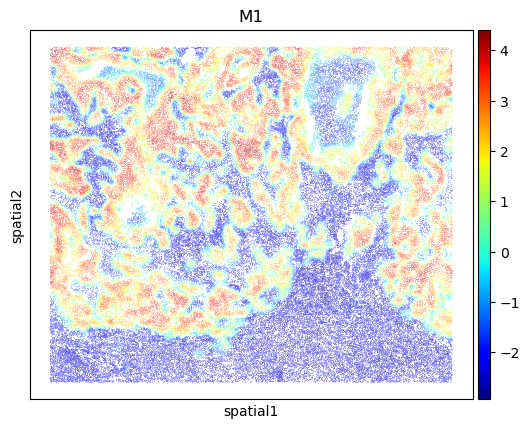

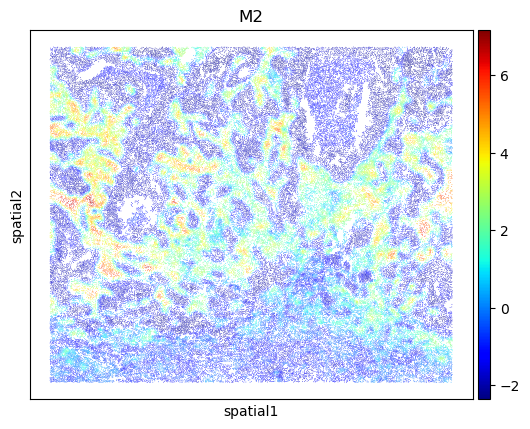

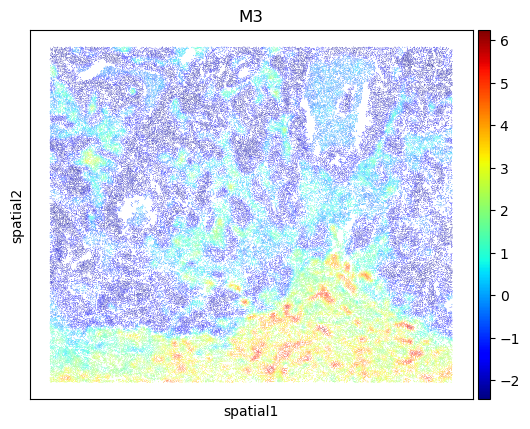

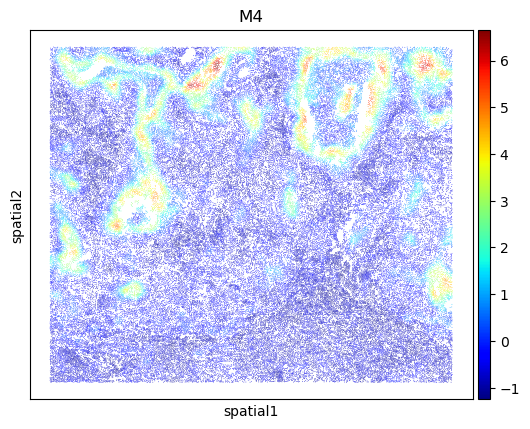

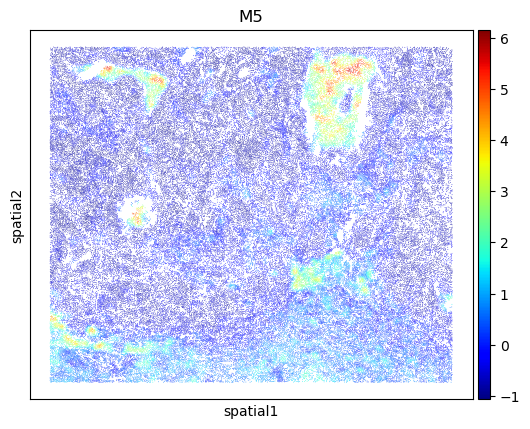

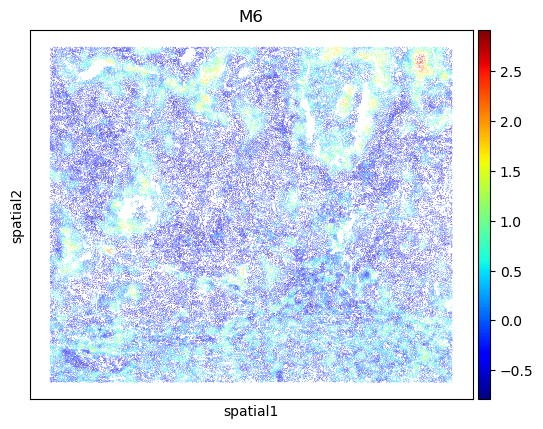

In [9]:
for module in range(1, hs.modules.max()+1):
    src_adata.obs['M%d'%module] = hs.module_scores[module]
    sc.pl.spatial(src_adata, img=None, color='M%d'%module, spot_size=40, color_map='jet', legend_fontsize='x-small', save='spatial_jet_M%d.pdf'%module)